# EDA (Exploratory data analysis)

### Prepare train set

In [5]:
import os
import re
import cv2
import random
from tqdm import tqdm
from pathlib import Path
from PIL import Image

import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [6]:
# Turning warnings into exceptions
pd.options.mode.chained_assignment = None

In [7]:
def draw_annotations(image, df): 
    for _, row in df.iterrows():
        points = row['points']
        x1, y1, x2, y2, x3, y3, x4, y4 = points
        contour = np.array([[x1,y1],[x2,y2],[x3,y3],[x4,y4]]).astype(np.int32)
        text = row['text']  
        if text == '###':
            cv2.drawContours(image, [contour], -1, (255, 0, 0), 2)  
        else:
            cv2.drawContours(image, [contour], -1, (0, 255, 0), 2)

In [8]:
def get_types(path):
    files = os.listdir(path)
    unq = []
    for f in files:
        file_dir, file_extension = os.path.splitext(f)
        if file_dir != '.DS_Store':
            unq.append(file_extension)
    return unq

In [9]:
def get_normalized_sizes_bbox(points, height_image, width_image, parameter=None):
    x1, y1, x2, y2, x3, y3, x4, y4 = points
    x_list, y_list = [x1, x2, x3, x4], [y1, y2, y3, y4]
    x_min, x_max = min(x_list), max(x_list)
    y_min, y_max = min(y_list), max(y_list)
    width_bbox_normalized = (x_max-x_min)/width_image
    height_bbox_normalized = (y_max-y_min)/height_image  
    if parameter == 'height':
        return height_bbox_normalized 
    elif parameter == 'width':
        return width_bbox_normalized

In [10]:
def load_anns(annotations_filenames,images_filenames, dir_annotations, dir_images):  
    data = []
    for i in range(len(annotations_filenames)):
        points = []
        words = []
        image = Image.open(os.path.join(dir_images, images_filenames[i]))
        width_image, height_image = image.size
        with open(os.path.join(dir_annotations, annotations_filenames[i]), encoding='utf-8-sig') as f:
            annotation_txt = f.readlines()
        for line in annotation_txt:
            line_split = line.split(",")
            points = [int(j) for j in line_split[:8]]
            text = ''.join(line_split[8:]).strip('\n')
            data.append((annotations_filenames[i], images_filenames[i], width_image, height_image, points, text))      
    df_return = pd.DataFrame(data, columns=['filename_annotation','filename_image',
                                           'width_image','height_image',
                                           'points', 'text'])
    return df_return

In [11]:
def four_point_transform(image, rect):
    tl, tr, br, bl = rect
    rect = np.float32([tl, tr, br, bl])
    widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
    widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))
    maxWidth = max(int(widthA), int(widthB))
    heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
    heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))
    maxHeight = max(int(heightA), int(heightB))

    dst = np.array([
        [0, 0],
        [maxWidth - 1, 0],
        [maxWidth - 1, maxHeight - 1],
        [0, maxHeight - 1],
    ], dtype="float32")

    matrix = cv2.getPerspectiveTransform(rect, dst)
    warped = cv2.warpPerspective(image, matrix, (maxWidth, maxHeight))
        
    return warped

In [12]:
def crop_document(df, image_fpath, out_dir, sub_dir, rot_dir):
    image = cv2.imread(image_fpath)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    texts = []
    for idx, (_, row) in enumerate(df.iterrows()):
        x1, y1, x2, y2, x3, y3, x4, y4 = row['points']
        points = np.array([[x1,y1], [x2, y2], [x3, y3], [x4, y4]])
        crop = four_point_transform(image, points)
        size_crop = crop.shape
        
        text = row['text']
        name = row['filename_image'].split('.')[0]
        filename_png = f'{name}_{idx}.png'

        if size_crop[1] < size_crop[0]:
            out_fpath = os.path.join(out_dir, rot_dir, filename_png)
            print('Rotated: ', out_fpath )
        else:
            out_fpath = os.path.join(out_dir, sub_dir, filename_png)
            
        cv2.imwrite(out_fpath, crop)
        texts.append((os.path.join(sub_dir, filename_png), text))
        
    return texts

In [26]:
def counting_unique_characters(column):
    chars = {}
    for word in column.values:
        for char in word: 
            if char not in chars:
                chars[char] = 1
            else:
                chars[char] += 1                   
    return chars

### Data types in annotations and images

In [13]:
# train
dir_dataset = 'ICDAR2015'

dir_images_train = os.path.join(dir_dataset, 'train/image')
type_files_images_train = get_types(dir_images_train)
print(f'Types of image files in в train: {set(type_files_images_train)}')

dir_annotations_train = os.path.join(dir_dataset, 'train/text')
type_files_annotations_train = get_types(dir_annotations_train)
print(f'Types of annotation files in train: {set(type_files_annotations_train)}')

# test
dir_images_test = os.path.join(dir_dataset, 'test/image')
type_files_images_test = get_types(dir_images_test)
print(f'Types of image files in в test: {set(type_files_images_test)}')

dir_annotations_test = os.path.join(dir_dataset, 'test/text')
type_files_annotations_test = get_types(dir_annotations_test)
print(f'Types of annotation files in test: {set(type_files_annotations_test)}')

Types of image files in в train: {'.jpg'}
Types of annotation files in train: {'.txt'}
Types of image files in в test: {'.jpg'}
Types of annotation files in test: {'.txt'}


### Images and annotations

In [14]:
annotations_filenames_train = [i for i in os.listdir(dir_annotations_train) if i != '.DS_Store']

images_filenames_train = []

for filename in annotations_filenames_train:
    filename_image = filename.split('.')[0][len('gt_'):] + '.jpg'
    images_filenames_train.append(filename_image)

images_filenames_train = sorted(images_filenames_train)
annotations_filenames_train = sorted(annotations_filenames_train)

In [15]:
len(images_filenames_train), len(annotations_filenames_train)

(1000, 1000)

In [16]:
df_data_train = load_anns(annotations_filenames_train, images_filenames_train,
                         dir_annotations_train, dir_images_train)

In [17]:
df_data_train.sample(10)

,filename_annotation,filename_image,width_image,height_image,points,text
7204,gt_img_611.txt,img_611.jpg,1280,720,"[490, 6, 516, 5, 516, 16, 490, 17]",###
3891,gt_img_377.txt,img_377.jpg,1280,720,"[560, 141, 600, 134, 604, 160, 564, 166]",WORLD
11432,gt_img_97.txt,img_97.jpg,1280,720,"[491, 570, 532, 560, 534, 578, 494, 588]",###
11110,gt_img_944.txt,img_944.jpg,1280,720,"[822, 567, 844, 567, 843, 590, 822, 590]",TOP
11772,gt_img_989.txt,img_989.jpg,1280,720,"[847, 297, 864, 296, 865, 310, 848, 312]",###
7032,gt_img_603.txt,img_603.jpg,1280,720,"[230, 286, 244, 287, 240, 307, 226, 306]",###
1669,gt_img_214.txt,img_214.jpg,1280,720,"[1031, 201, 1071, 200, 1071, 209, 1030, 210]",###
5510,gt_img_485.txt,img_485.jpg,1280,720,"[562, 177, 594, 176, 594, 185, 562, 186]",###
800,gt_img_152.txt,img_152.jpg,1280,720,"[267, 299, 294, 299, 294, 310, 267, 310]",###
5260,gt_img_465.txt,img_465.jpg,1280,720,"[425, 552, 470, 687, 447, 694, 414, 569]",###


In [18]:
len(df_data_train)

11886

### Visualization of the markup on 5 examples

['###', '###', '###', '###', '###', '###', 'MARC', '###', '###', '###', '###', '###', '###']


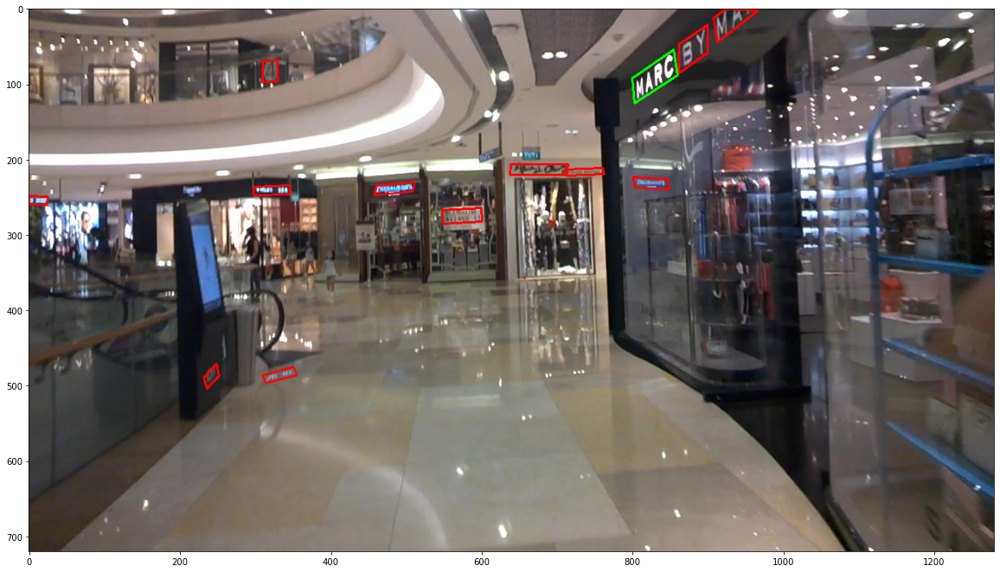

['###', '###', '###', '###', '###', 'KILLNEY', 'BOAD', 'ORCHARD', 'ROAD', '###', 'lifts', 'serve', '###', '###', 'L10.', 'Access', '###', 'Levels', '11/12', 'please', 'transfer', '###', 'Levels', 'B2/1/4/7/9', 'case', 'approach', 'concierge', '###', 'Level', '###', 'orse', '###', '###', '###', 'not', 'use', 'lift.', 'B-One', 'The', 'Med', '###', '###', '###', '###', '###', '###']


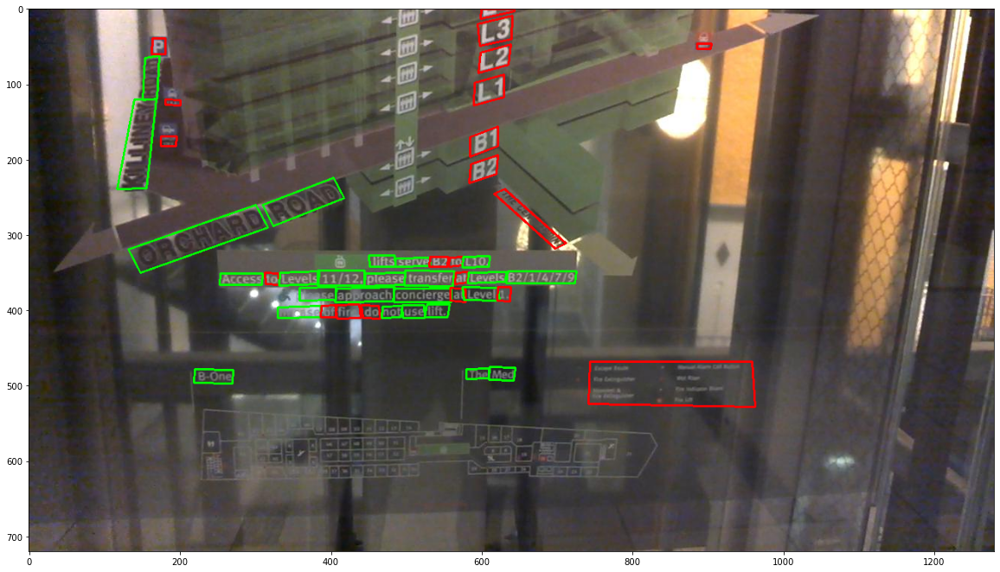

['CORDIAL', 'CORDIAL', 'CORDIAL', 'CORDIAL', 'SYRUP', 'CORDIAL', '###', '###', '###', '###', '###']


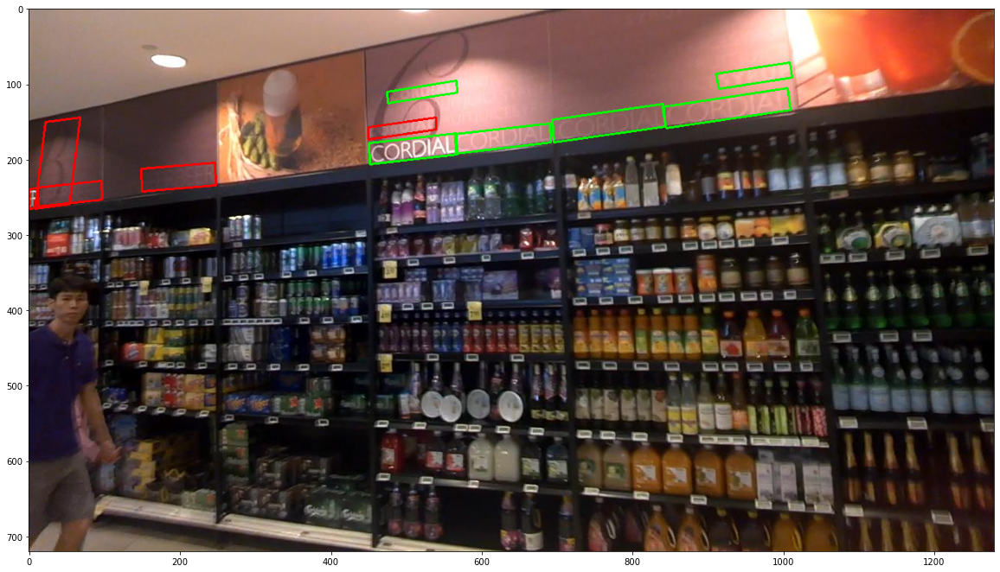

["McDonald's", 'Uno', '###', '###', '###', '###', 'Public', '###', '###', '###', '###', '###', '###', '###', '###', '###', '###', '###', '###']


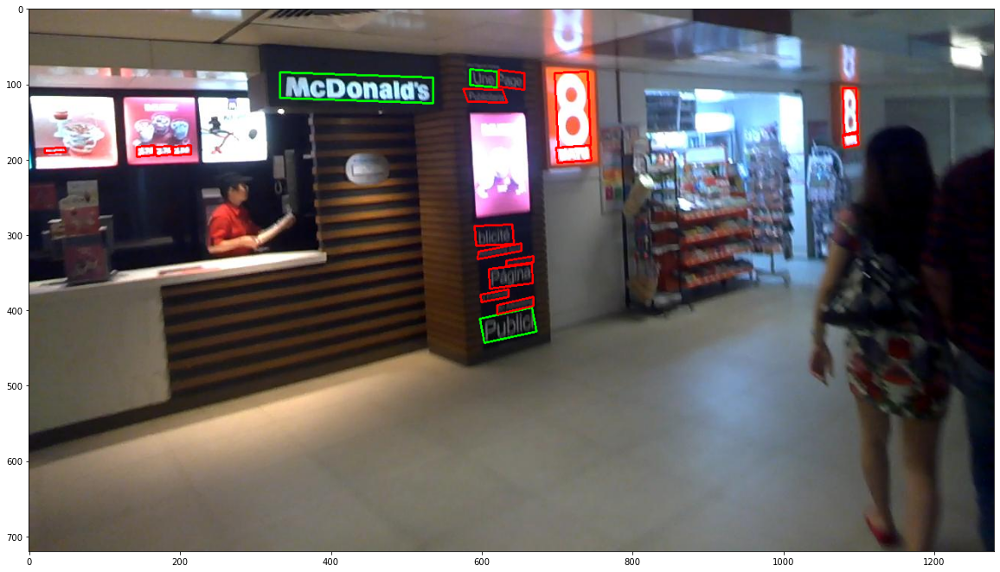

['###', 'Tots', '###', '###', 'Mum', '###', '###', 'Mum', '###', 'Tots', 'Mum', '###', '###']


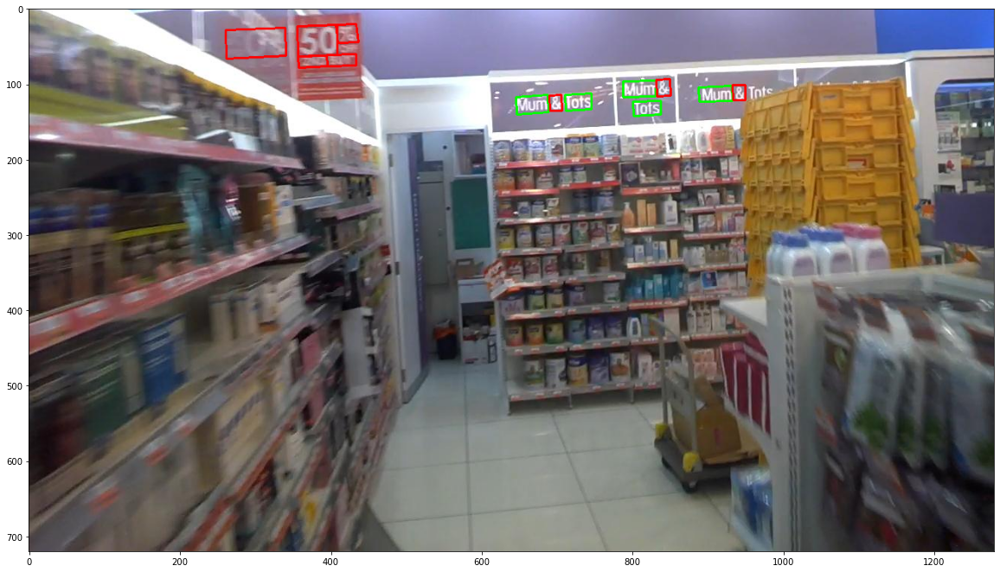

In [20]:
for _ in range(5):
    idx = random.randint(0, len(annotations_filenames_train)-1)
    image_fpath = os.path.join(dir_images_train, images_filenames_train[idx])
    annotation_fpath = os.path.join(dir_annotations_train, annotations_filenames_train[idx])
    df_temp = df_data_train[(df_data_train['filename_image'] == images_filenames_train[idx])
                                   & (df_data_train['filename_annotation'] == annotations_filenames_train[idx])]
    print(df_temp['text'].tolist())
    image = cv2.imread(image_fpath)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image_copy = image.copy()
    draw_annotations(image_copy, df_temp)
    plt.figure(figsize=(20,30)) # 1 дюйм на 1 дюйм - 80 на 80
    plt.imshow(image_copy)
    plt.show()

### Data filtering

In [21]:
df_data_train_filtered = df_data_train[df_data_train['text'] != '###']
df_data_train_filtered.reset_index(drop=True, inplace=True)
df_data_train_filtered.sample(10)

,filename_annotation,filename_image,width_image,height_image,points,text
1762,gt_img_428.txt,img_428.jpg,1280,720,"[757, 647, 955, 657, 953, 712, 755, 702]",ROCHER
1299,gt_img_327.txt,img_327.jpg,1280,720,"[611, 574, 656, 582, 656, 607, 612, 598]",India
531,gt_img_19.txt,img_19.jpg,1280,720,"[287, 142, 432, 143, 418, 227, 273, 226]",needs
4309,gt_img_978.txt,img_978.jpg,1280,720,"[0, 591, 119, 567, 120, 591, 0, 624]",CCO
2852,gt_img_679.txt,img_679.jpg,1280,720,"[1047, 30, 1129, 20, 1133, 60, 1050, 65]",adidas
3203,gt_img_77.txt,img_77.jpg,1280,720,"[890, 121, 939, 130, 938, 143, 889, 134]",HIVa
2567,gt_img_600.txt,img_600.jpg,1280,720,"[233, 213, 285, 210, 286, 232, 235, 235]",steps
802,gt_img_240.txt,img_240.jpg,1280,720,"[289, 492, 330, 479, 332, 493, 291, 506]",Comfort
3022,gt_img_716.txt,img_716.jpg,1280,720,"[1064, 112, 1274, 30, 1276, 121, 1066, 191]",HUBL
26,gt_img_107.txt,img_107.jpg,1280,720,"[765, 468, 819, 452, 824, 464, 770, 481]",Canon


In [22]:
len(df_data_train_filtered)

4468

### Normalization of bbox sizes

In [23]:
df_data_train_filtered['width_bbox_normalized'] = df_data_train_filtered.apply(lambda x: 
                                                                               get_normalized_sizes_bbox(
                                                                                    x['points'],
                                                                                    x['height_image'],
                                                                                    x['width_image'],
                                                                                    'width'), axis=1)
                                                                                                                                                                            
df_data_train_filtered['height_bbox_normalized'] = df_data_train_filtered.apply(lambda x: 
                                                                                get_normalized_sizes_bbox(
                                                                                    x['points'],
                                                                                    x['height_image'],
                                                                                    x['width_image'],
                                                                                    'height'), axis=1)

In [24]:
df_data_train_filtered.sample(10)

,filename_annotation,filename_image,width_image,height_image,points,text,width_bbox_normalized,height_bbox_normalized
404,gt_img_163.txt,img_163.jpg,1280,720,"[998, 141, 1019, 139, 1020, 158, 999, 160]",BOX,0.017188,0.029167
2610,gt_img_611.txt,img_611.jpg,1280,720,"[1006, 330, 1135, 332, 1138, 363, 1009, 361]",CRIME,0.103125,0.045833
2487,gt_img_586.txt,img_586.jpg,1280,720,"[935, 496, 1008, 505, 1028, 573, 955, 564]",SCAN,0.072656,0.106944
3496,gt_img_830.txt,img_830.jpg,1280,720,"[419, 389, 464, 392, 462, 409, 417, 406]",MERCI,0.036719,0.027778
1187,gt_img_308.txt,img_308.jpg,1280,720,"[559, 43, 626, 30, 630, 57, 563, 70]",OSAKA,0.055469,0.055556
926,gt_img_260.txt,img_260.jpg,1280,720,"[1090, 461, 1275, 480, 1274, 502, 1089, 482]",UNIVERSITY,0.145313,0.056944
2603,gt_img_61.txt,img_61.jpg,1280,720,"[1044, 531, 1074, 536, 1076, 585, 1046, 579]",YOU,0.025000,0.075000
3372,gt_img_796.txt,img_796.jpg,1280,720,"[422, 276, 459, 278, 457, 294, 420, 292]",SALES,0.030469,0.025000
177,gt_img_126.txt,img_126.jpg,1280,720,"[1211, 453, 1275, 459, 1272, 483, 1208, 477]",Park,0.052344,0.041667
3325,gt_img_784.txt,img_784.jpg,1280,720,"[523, 108, 611, 101, 612, 118, 525, 126]",EXCHANGE,0.069531,0.034722


### Analyzing characters in the text

In [27]:
count_chars_train = counting_unique_characters(df_data_train_filtered['text'])
count_chars_train

{'G': 354,
 'e': 1082,
 'n': 625,
 'a': 860,
 'x': 28,
 'i': 666,
 's': 577,
 ' ': 55,
 'T': 920,
 'h': 308,
 't': 583,
 'r': 667,
 '[': 2,
 '0': 207,
 '6': 41,
 ']': 2,
 '2': 124,
 '-': 69,
 '3': 51,
 'C': 608,
 'p': 203,
 'k': 101,
 'H': 411,
 'b': 93,
 'o': 687,
 'u': 299,
 'F': 271,
 'W': 186,
 'y': 165,
 'L': 774,
 'P': 407,
 'l': 427,
 'f': 141,
 'm': 216,
 'A': 1235,
 'R': 866,
 'E': 1482,
 'S': 1208,
 'I': 885,
 'K': 173,
 'O': 1013,
 'M': 378,
 'D': 397,
 'g': 173,
 'd': 260,
 'B': 341,
 'N': 807,
 'Y': 237,
 'U': 333,
 'Q': 19,
 '!': 53,
 'X': 113,
 'V': 162,
 'J': 77,
 'c': 331,
 'w': 99,
 '8': 47,
 '#': 16,
 '5': 81,
 '1': 186,
 'v': 123,
 '.': 98,
 '$': 47,
 '9': 66,
 'j': 15,
 '(': 6,
 ')': 5,
 'z': 12,
 '4': 44,
 '/': 24,
 '7': 46,
 "'": 51,
 ':': 19,
 '%': 28,
 '"': 8,
 '´': 3,
 'Z': 30,
 '&': 9,
 '?': 5,
 'É': 1,
 'q': 3,
 '@': 4,
 ';': 3,
 '=': 1,
 '+': 1}

### Building a histogram

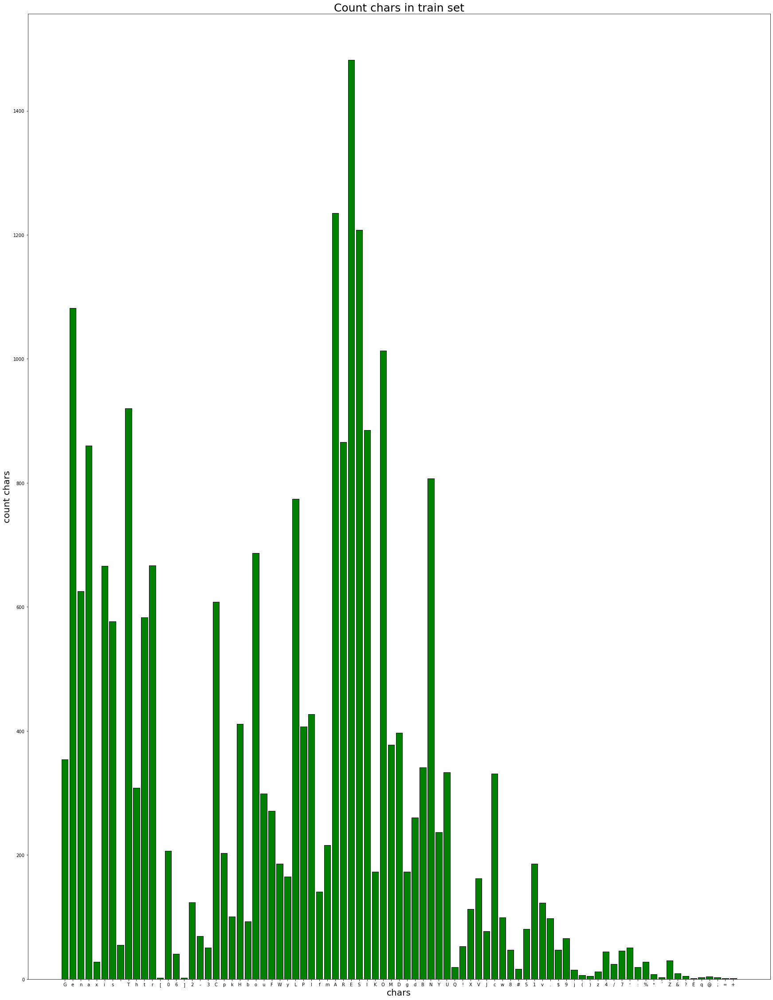

In [28]:
plt.figure(figsize=(30,40))
plt.bar(count_chars_train.keys(), count_chars_train.values(), align = 'center', color='g', edgecolor='black')                                                                        
plt.xlabel('chars', fontsize=20)
plt.ylabel('count chars', fontsize=20)
plt.title('Count chars in train set', fontsize=25)
plt.show()

### Create scatterplot for width and height bbox

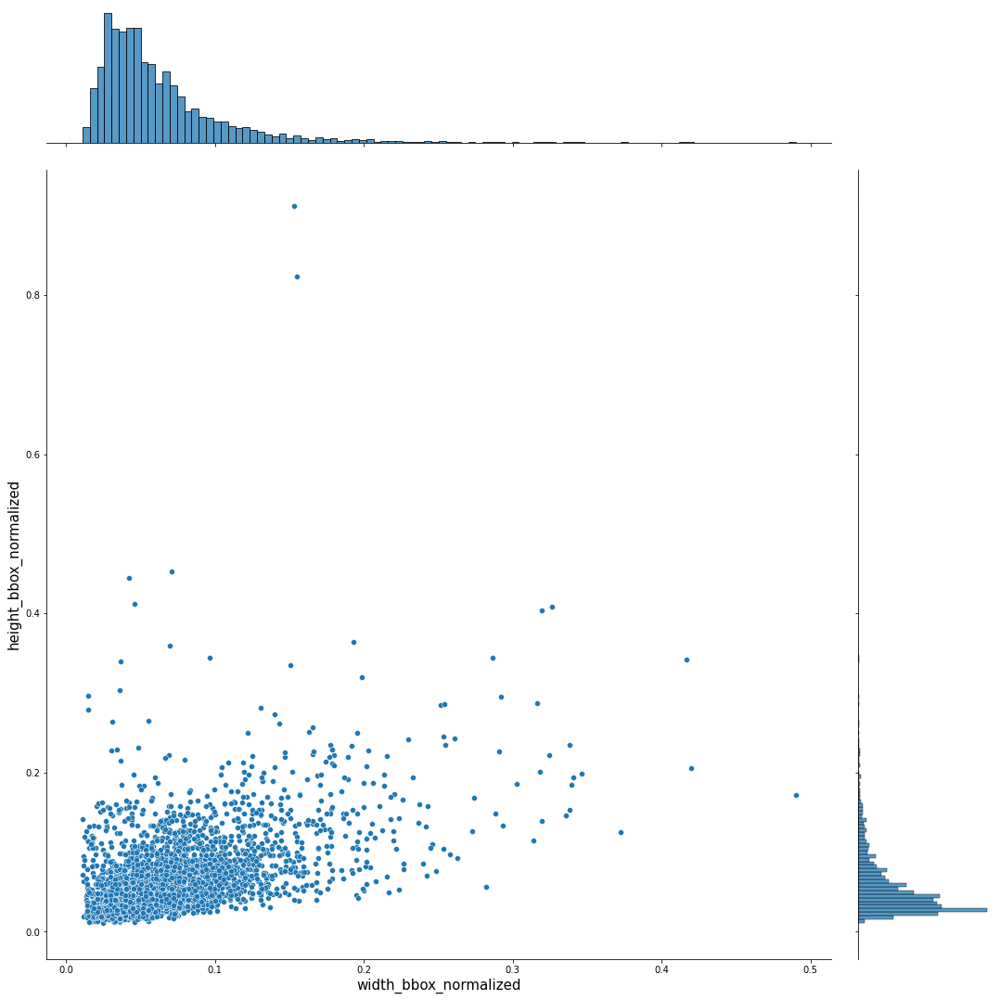

In [29]:
h = sns.jointplot(data=df_data_train_filtered, x="width_bbox_normalized", y="height_bbox_normalized", height=15)
h.set_axis_labels('width_bbox_normalized', 'height_bbox_normalized', fontsize=15)

### Find emissions

In [30]:
df_data_train_emissions = df_data_train_filtered[
    (df_data_train_filtered['height_bbox_normalized'] > 0.3)
    | (df_data_train_filtered['width_bbox_normalized'] > 0.28)
]
df_data_train_emissions.reset_index(drop=True, inplace=True)
df_data_train_emissions.sample(10)

,filename_annotation,filename_image,width_image,height_image,points,text,width_bbox_normalized,height_bbox_normalized
11,gt_img_550.txt,img_550.jpg,1280,720,"[336, 118, 408, 169, 357, 366, 285, 315]",POH,0.096094,0.344444
1,gt_img_255.txt,img_255.jpg,1280,720,"[277, 469, 573, 446, 680, 542, 273, 591]",HUMP,0.317969,0.201389
20,gt_img_704.txt,img_704.jpg,1280,720,"[886, 2, 1236, 5, 1260, 137, 908, 215]",MORE,0.292187,0.295833
25,gt_img_777.txt,img_777.jpg,1280,720,"[546, 161, 1022, 141, 1021, 211, 545, 231]",GEIGER,0.372656,0.125000
2,gt_img_28.txt,img_28.jpg,1280,720,"[474, 1, 862, 15, 819, 106, 432, 92]",SMRT,0.335938,0.145833
14,gt_img_636.txt,img_636.jpg,1280,720,"[695, 204, 1199, 185, 1228, 412, 723, 431]",CiTYLiNK,0.416406,0.341667
31,gt_img_873.txt,img_873.jpg,1280,720,"[891, 60, 1277, 32, 1278, 138, 892, 166]",SALE,0.302344,0.186111
27,gt_img_790.txt,img_790.jpg,1280,720,"[281, 175, 902, 127, 908, 203, 287, 251]",WAREHOUSE,0.489844,0.172222
28,gt_img_791.txt,img_791.jpg,1280,720,"[340, 110, 737, 97, 742, 167, 346, 180]",FOREVER,0.314063,0.115278
22,gt_img_749.txt,img_749.jpg,1280,720,"[171, 388, 520, 260, 580, 423, 231, 551]",ZARA,0.319531,0.404167


In [31]:
images_filenames_train_emissions = sorted(df_data_train_emissions['filename_image'].unique())
annotations_filenames_train_emissions = sorted(df_data_train_emissions['filename_annotation'].unique())

### Visualization of the emissions on 5 examples

['MORE']


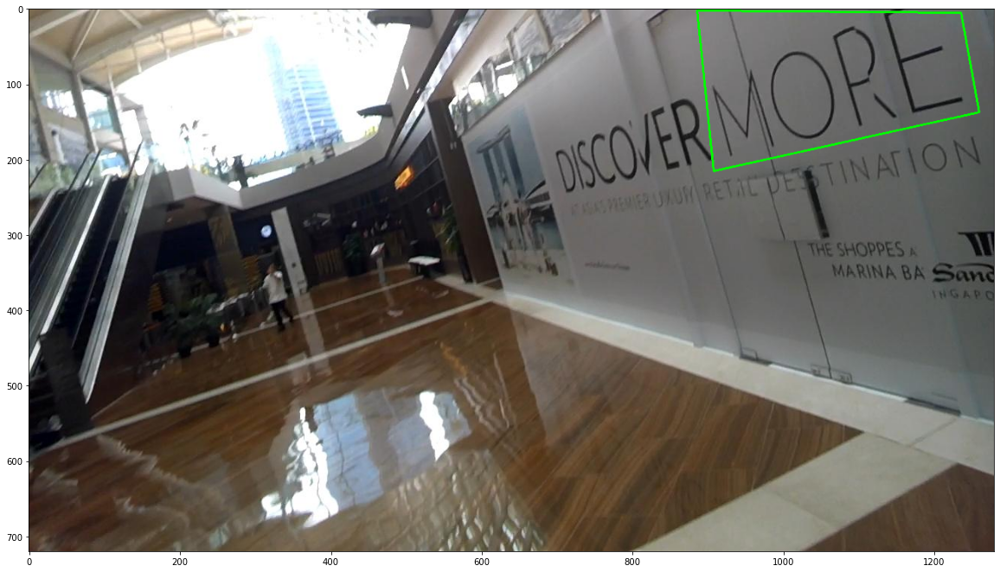

['COOL']


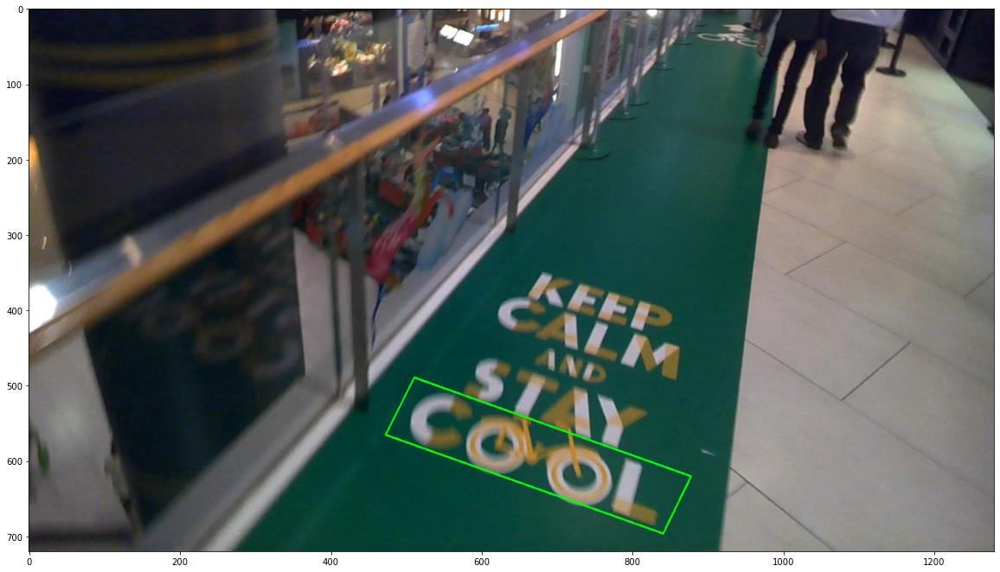

['GIORDA']


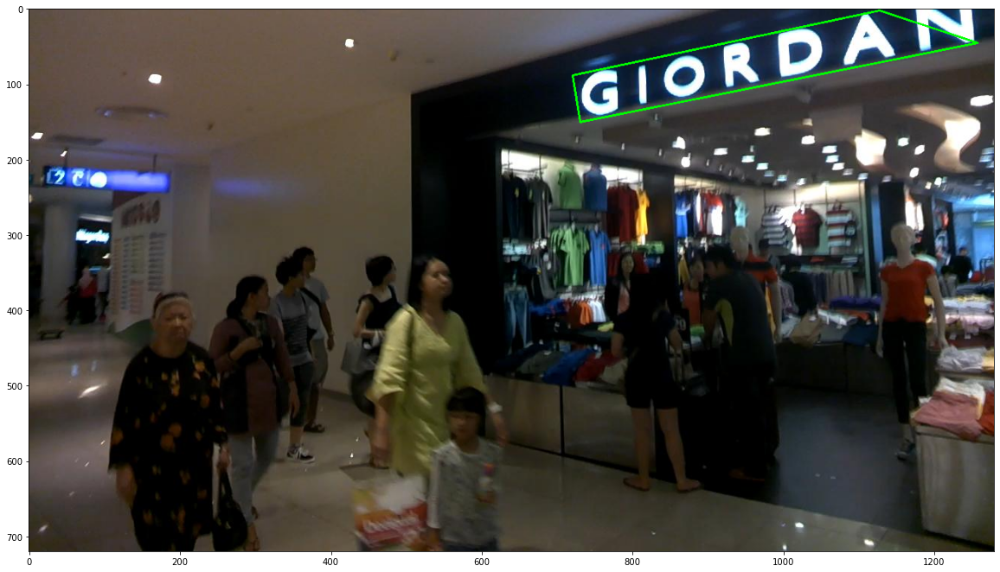

['ZARA']


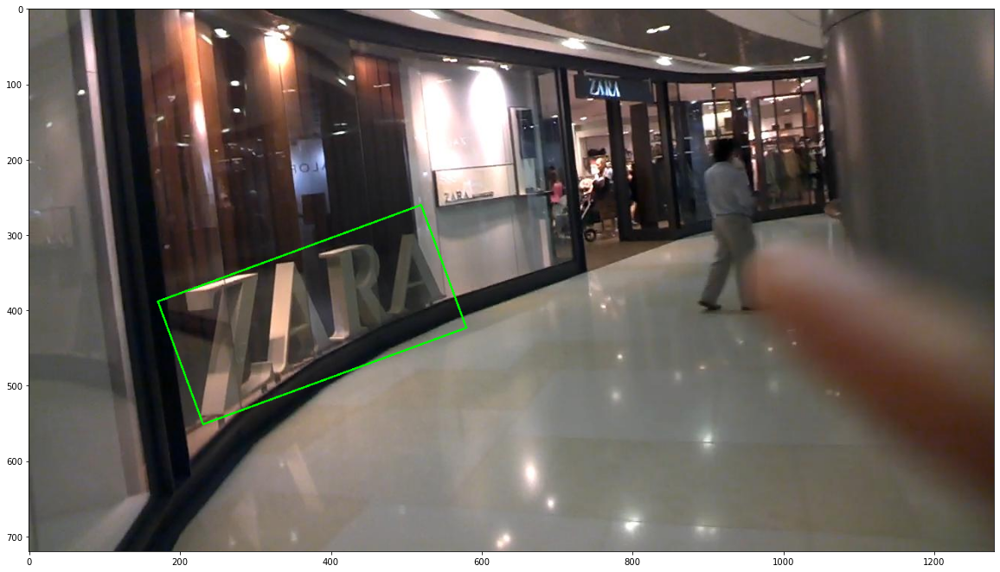

['MOLESKINE']


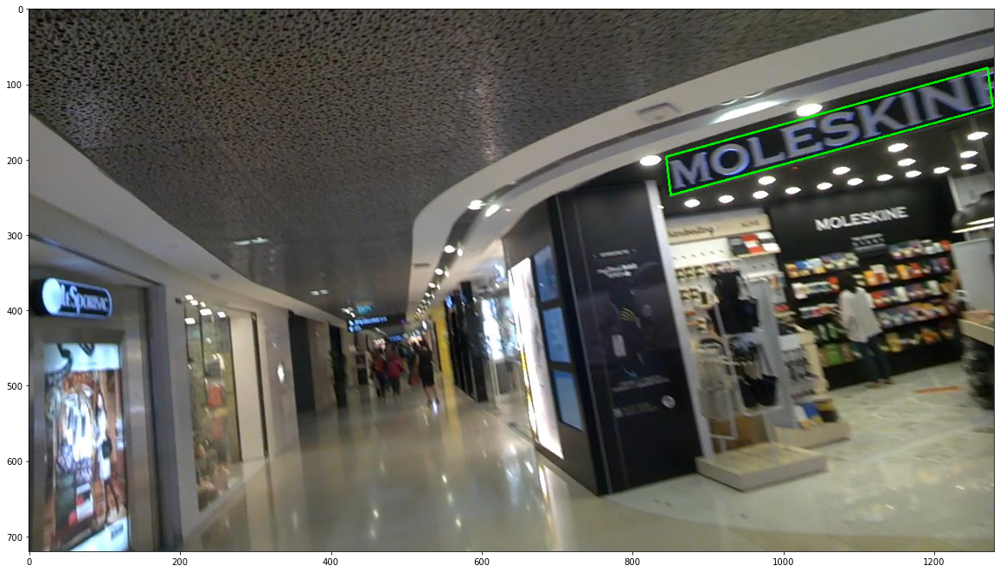

In [33]:
for _ in range(5):
    idx = random.randint(0, len(annotations_filenames_train_emissions)-1)
    image_fpath = os.path.join(dir_images_train, images_filenames_train_emissions[idx])
    annotation_fpath = os.path.join(dir_annotations_train, annotations_filenames_train_emissions[idx])
    
    df_temp = df_data_train_emissions[(df_data_train_emissions['filename_image'] == images_filenames_train_emissions[idx])
                                   & (df_data_train_emissions['filename_annotation'] == annotations_filenames_train_emissions[idx])]
    
    image = cv2.imread(image_fpath)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    print(df_temp['text'].tolist())
    
    image_copy = image.copy()
    draw_annotations(image_copy, df_temp)
    
    plt.figure(figsize=(20,30))
    plt.imshow(image_copy)
    plt.show()

### Create crops and save on disc

In [ ]:
images_filenames_train_filtered = sorted(df_data_train_filtered['filename_image'].unique())
annotations_filenames_train_filtered = sorted(df_data_train_filtered['filename_annotation'].unique())

train_pages = list(zip(images_filenames_train_filtered, annotations_filenames_train_filtered))

dir_out = 'crops'
data_crops_train = []

for i in tqdm(range(len(train_pages))):
    filename_image, filename_annotation = train_pages[i]
    image_fpath = os.path.join(dir_images_train, filename_image)
    annotation_fpath = os.path.join(dir_annotations_train, filename_annotation)
    df_page = df_data_train_filtered[(df_data_train_filtered['filename_image'] == filename_image) 
                       & (df_data_train_filtered['filename_annotation'] == filename_annotation)
    ]

    
    data_crops_train.extend(crop_document(df_page, image_fpath, dir_out, 'train', 'train_rotation'))

### Create the resulting csv file

In [145]:
df_crops_train = pd.DataFrame(data_crops_train, columns=['filename', 'text'])
out_fpath_train = os.path.join(dir_out, 'train.csv')
df_crops_train.to_csv(out_fpath_train, header=True, index=False)